This notebook demonstrates how collision-free robot trajectories can be learnt using the the safemotions package. <br>
Note: Colab does not provide a display server, however, it is possible to render videos of the generated movements. 
When running the package on your local machine, you can add the command line argument "--use_gui" for instantaneous visualization. 

The robots in the following examples are controlled by neural networks that are trained to reach as many randomly sampled target points as possible without causing collisions. 

Examples:
1.   [One industrial robot](#t1), single target point, 
2.   [Two industrial robots](#t2), alternating target points
3.   [Three industrial robots](#t3), alternating target points
4.   [Humanoid robot ARMAR 6](#t4), simultaneous target points
5.   [Humanoid robot ARMAR 6](#t5), alternating target points
6.   [Humanoid robot ARMAR 6](#t6), single target point
7.   [Four-armed humanoid robot ARMAR 6x4](#t7), simultaneous target points
8.   [Four-armed humanoid robot ARMAR 6x4](#t8), alternating target points
9.   [Four-armed humanoid robot ARMAR 6x4](#t9), single target point

<font color='#75052d'>Red</font> and <font color='#0000aa'>blue</font> flashing of a robot link indicates that an alternative safe behavior is performed to prevent a collision with another robot link and a static obstacle, respectively. 

As a first step, run the following cell to install all required dependencies.


In [ ]:
# First step: install the safemotions[train] package via pip
! pip install pybullet==3.2.1
! pip install redis==3.5.3
! pip install prometheus-client==0.11.0
! pip install aiohttp==3.7.4.post0
! pip install aiohttp-cors==0.7.0
! pip install aioredis==1.3.1
! pip install ray[default]==1.4.1
! pip install safemotions[train]
! pip install armar
! pip install lz4
! pip install gputil
%matplotlib inline
# Use a renderer with hardware acceleration provided that a GPU is available. 
import GPUtil
renderer = "egl" if len(GPUtil.getGPUs()) > 0 else "cpu"
if renderer == "cpu":
  print("Using CPU renderer.")
else:
  print("Using GPU renderer.")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 90.8 MB 1.8 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 72 kB 586 kB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 56 kB 2.9 MB/s 
  Attempting uninstall: prometheus-client
    Found existing installation: prometheus-client 0.14.1
    Uninstalling prometheus-client-0.14.1:
      Successfully uninstalled prometheus-client-0.14.1
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.3 MB 4.9 MB/s 
     |████████████████████████████████| 271 kB 74.4 MB/s 
     |████████████████████████████████| 94 kB 4.2 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.p



---

<a name="t1"></a>
1.   One industrial robot, single target point
<br>
Note: Since the virtual walls around the robot are transparent, only the GPU-based renderer can be used for this example. <br>




2022-06-14 23:28:13,723	WARNING deprecation.py:34 -- DeprecationWarning: `register_custom_model` has been deprecated. This will raise an error in the future!
2022-06-14 23:28:16,900	INFO trainer.py:671 -- Tip: set framework=tfe or the --eager flag to enable TensorFlow eager execution
2022-06-14 23:28:16,906	INFO trainer.py:698 -- Current log_level is WARN. For more information, set 'log_level': 'INFO' / 'DEBUG' or use the -v and -vv flags.
INFO:root:Pos upper limits: [2.93205973 2.0593951  2.93205973 2.0593951  2.93205973 2.0593951
 3.01932619]
INFO:root:Pos lower limits: [-2.93205973 -2.0593951  -2.93205973 -2.0593951  -2.93205973 -2.0593951
 -3.01932619]
INFO:root:Vel limits: [1.71042267 1.71042267 1.74532925 2.26892803 2.44346095 3.14159265
 3.14159265]
INFO:root:Acc limits: [15.   7.5 10.  12.5 15.  20.  20. ]
INFO:root:Jerk limits: [300. 150. 200. 250. 300. 400. 400.]
INFO:root:Torque limits: [176. 176. 110. 110. 110.  40.  40.]
INFO:root:Trajectory time step: 0.1
INFO:root:Observ

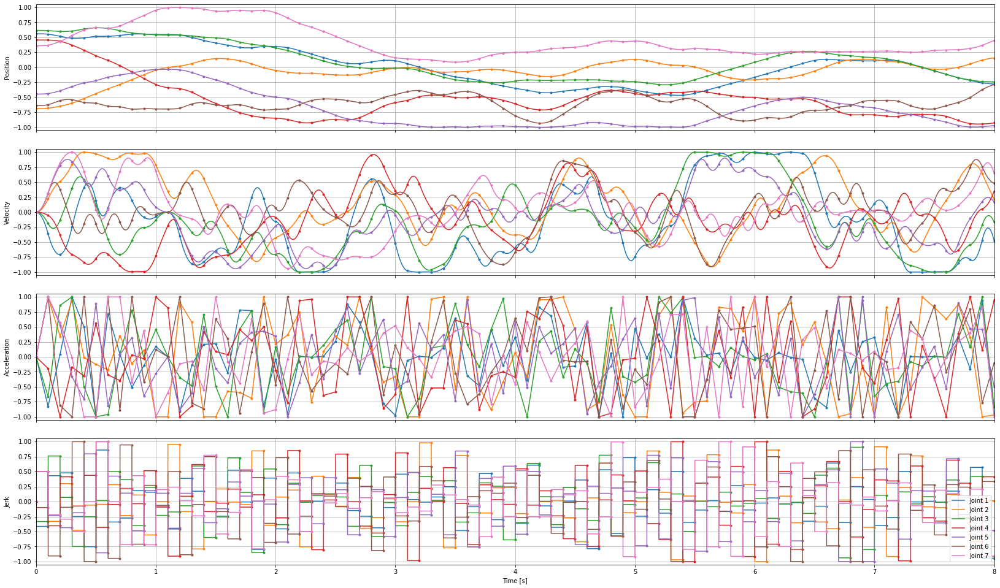

INFO:root:Computing episode 1 took 12.443822860717773 seconds
INFO:root:Trajectory duration: 8.0 seconds
INFO:root:Episode reward: 121.26708890588179
INFO:root:Computed 1 episode(s) in 13.670323371887207 seconds.
INFO:root:Mean computation time: 12.443822860717773 seconds, Max computation time: 12.443822860717773 seconds.


In [ ]:
import os, safemotions
from IPython.display import HTML, display
from base64 import b64encode
package_dir = os.path.dirname(safemotions.__file__)
video_height = 720
video_frame_rate = 24
video_width = int(16/9 * video_height)
evaluate_script = os.path.join(package_dir, "evaluate.py")
if renderer == "cpu":
  print("This example requires a GPU-based renderer as the walls around the robot are transparent. Unfortunately, transparency is not supported by the cpu renderer. Try to run the other examples instead.")
else:
  %run -G "$evaluate_script" --checkpoint=industrial/one_robot/collision --online_trajectory_duration=8.0 --plot_trajectory --episodes=1 --render --renderer=$renderer --video_frame_rate=$video_frame_rate --camera_angle=8 --video_height=$video_height --fixed_video_filename --video_dir="/content"
  video_filename = os.path.join("/content", "episode_1.mp4")
  video_file = open(video_filename,'rb').read()
  url = "data:video/mp4;base64," + b64encode(video_file).decode()
  display(HTML("""<video width="%s" controls><source src="%s" type="video/mp4"></video>""" % (video_width, url)))



---

<a name="t2"></a>
2.   Two industrial robots, alternating target points
<br>

2021-08-25 14:41:14,555	WARNING deprecation.py:34 -- DeprecationWarning: `register_custom_model` has been deprecated. This will raise an error in the future!
2021-08-25 14:41:14,566	INFO worker.py:746 -- Calling ray.init() again after it has already been called.
INFO:root:Pos upper limits: [2.93205973 2.0593951  2.93205973 2.0593951  2.93205973 2.0593951
 3.01932619 2.93205973 2.0593951  2.93205973 2.0593951  2.93205973
 2.0593951  3.01932619]
INFO:root:Pos lower limits: [-2.93205973 -2.0593951  -2.93205973 -2.0593951  -2.93205973 -2.0593951
 -3.01932619 -2.93205973 -2.0593951  -2.93205973 -2.0593951  -2.93205973
 -2.0593951  -3.01932619]
INFO:root:Vel limits: [1.71042267 1.71042267 1.74532925 2.26892803 2.44346095 3.14159265
 3.14159265 1.71042267 1.71042267 1.74532925 2.26892803 2.44346095
 3.14159265 3.14159265]
INFO:root:Acc limits: [15.   7.5 10.  12.5 15.  20.  20.  15.   7.5 10.  12.5 15.  20.  20. ]
INFO:root:Jerk limits: [300. 150. 200. 250. 300. 400. 400. 300. 150. 200. 250. 

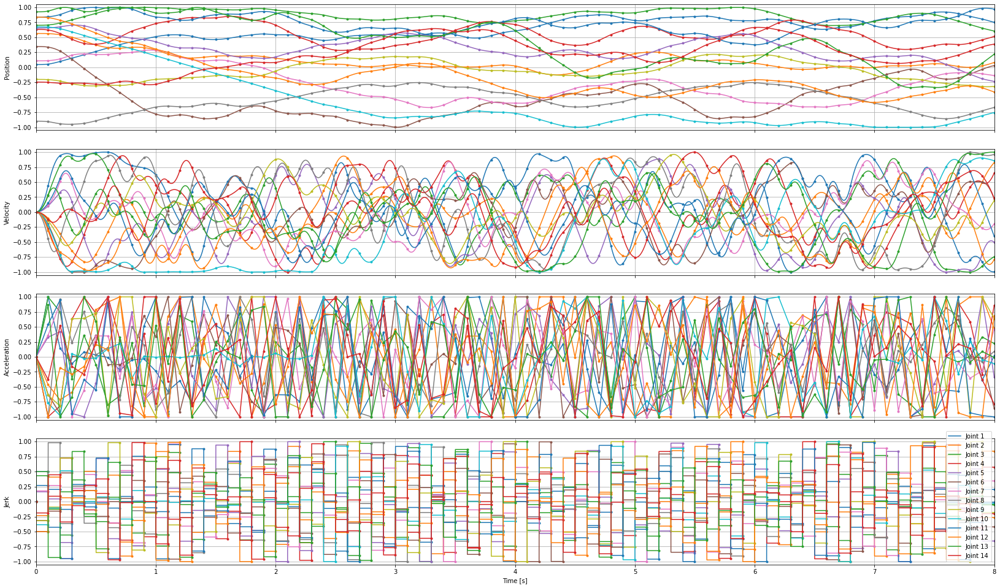

INFO:root:Computing episode 1 took 19.93354368209839 seconds
INFO:root:Trajectory duration: 8.0 seconds
INFO:root:Episode reward: 91.55390756030695
INFO:root:Computed 1 episode(s) in 20.617343187332153 seconds.
INFO:root:Mean computation time: 19.93354368209839 seconds, Max computation time: 19.93354368209839 seconds.


In [ ]:
import os, safemotions
from IPython.display import HTML
from base64 import b64encode
package_dir = os.path.dirname(safemotions.__file__)
evaluate_script = os.path.join(package_dir, "evaluate.py")
if renderer == "cpu":
  video_height = 360
  video_frame_rate = 15
else:
  video_height = 720
  video_frame_rate = 24
video_width = int(16/9 * video_height)

%run -G "$evaluate_script" --checkpoint=industrial/two_robots/collision/alternating --online_trajectory_duration=8.0 --plot_trajectory --episodes=1 --render --renderer=$renderer --video_frame_rate=$video_frame_rate --camera_angle=8 --video_height=$video_height --fixed_video_filename --video_dir="/content"
video_filename = os.path.join("/content", "episode_1.mp4")
video_file = open(video_filename,'rb').read()
url = "data:video/mp4;base64," + b64encode(video_file).decode()
HTML("""<video width="%s" controls><source src="%s" type="video/mp4"></video>""" % (video_width, url))



---

<a name="t3"></a>
3.   Three industrial robots, alternating target points

2021-08-25 14:45:31,505	WARNING deprecation.py:34 -- DeprecationWarning: `register_custom_model` has been deprecated. This will raise an error in the future!
2021-08-25 14:45:31,514	INFO worker.py:746 -- Calling ray.init() again after it has already been called.
INFO:root:Pos upper limits: [2.93205973 2.0593951  2.93205973 2.0593951  2.93205973 2.0593951
 3.01932619 2.93205973 2.0593951  2.93205973 2.0593951  2.93205973
 2.0593951  3.01932619 2.93205973 2.0593951  2.93205973 2.0593951
 2.93205973 2.0593951  3.01932619]
INFO:root:Pos lower limits: [-2.93205973 -2.0593951  -2.93205973 -2.0593951  -2.93205973 -2.0593951
 -3.01932619 -2.93205973 -2.0593951  -2.93205973 -2.0593951  -2.93205973
 -2.0593951  -3.01932619 -2.93205973 -2.0593951  -2.93205973 -2.0593951
 -2.93205973 -2.0593951  -3.01932619]
INFO:root:Vel limits: [1.71042267 1.71042267 1.74532925 2.26892803 2.44346095 3.14159265
 3.14159265 1.71042267 1.71042267 1.74532925 2.26892803 2.44346095
 3.14159265 3.14159265 1.71042267 1.

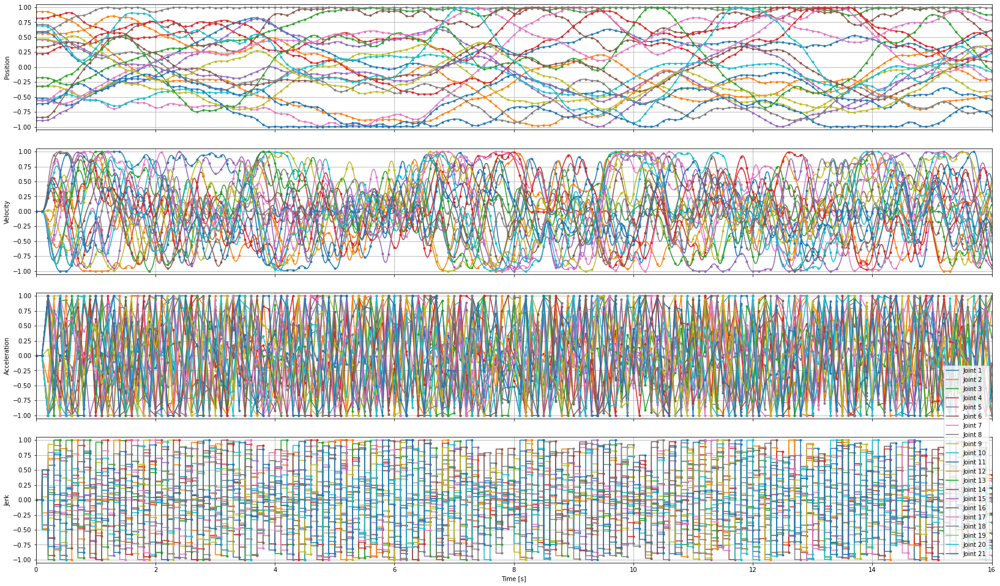

INFO:root:Computing episode 1 took 49.7606303691864 seconds
INFO:root:Trajectory duration: 16.0 seconds
INFO:root:Episode reward: 84.93811803815257
INFO:root:Computed 1 episode(s) in 50.5850944519043 seconds.
INFO:root:Mean computation time: 49.7606303691864 seconds, Max computation time: 49.7606303691864 seconds.


In [ ]:
import os, safemotions
from IPython.display import HTML
from base64 import b64encode
package_dir = os.path.dirname(safemotions.__file__)
evaluate_script = os.path.join(package_dir, "evaluate.py")
if renderer == "cpu":
  video_height = 360
  video_frame_rate = 15
else:
  video_height = 720
  video_frame_rate = 24
video_width = int(16/9 * video_height)

%run -G "$evaluate_script" --checkpoint=industrial/three_robots/collision/alternating --online_trajectory_duration=16.0 --plot_trajectory --episodes=1 --render --renderer=$renderer --video_frame_rate=$video_frame_rate --camera_angle=8 --video_height=$video_height --fixed_video_filename --video_dir="/content"
video_filename = os.path.join("/content", "episode_1.mp4")
video_file = open(video_filename,'rb').read()
url = "data:video/mp4;base64," + b64encode(video_file).decode()
HTML("""<video width="%s" controls><source src="%s" type="video/mp4"></video>""" % (video_width, url))



---

<a name="t4"></a>
4.   Humanoid robot ARMAR 6, simultaneous target points

In [ ]:
import os, safemotions
from IPython.display import HTML
from base64 import b64encode
package_dir = os.path.dirname(safemotions.__file__)
evaluate_script = os.path.join(package_dir, "evaluate.py")
if renderer == "cpu":
  video_height = 360
  video_frame_rate = 15
else:
  video_height = 720
  video_frame_rate = 24
video_width = int(16/9 * video_height)

%run -G "$evaluate_script" --checkpoint=humanoid/armar6/collision/simultaneous --online_trajectory_duration=8.0 --episodes=1 --render --renderer=$renderer --video_frame_rate=$video_frame_rate --camera_angle=9 --video_height=$video_height --fixed_video_filename --video_dir="/content"
video_filename = os.path.join("/content", "episode_1.mp4")
video_file = open(video_filename,'rb').read()
url = "data:video/mp4;base64," + b64encode(video_file).decode()
HTML("""<video width="%s" controls><source src="%s" type="video/mp4"></video>""" % (video_width, url))

2021-08-25 14:48:05,854	WARNING deprecation.py:34 -- DeprecationWarning: `register_custom_model` has been deprecated. This will raise an error in the future!
2021-08-25 14:48:05,862	INFO worker.py:746 -- Calling ray.init() again after it has already been called.
INFO:root:Pos upper limits: [0.         1.3962634  1.57079633 3.1        1.57079633 2.51
 1.57079633 0.64       1.52       1.3962634  1.57079633 3.1
 1.57079633 2.51       1.57079633 0.64       1.52      ]
INFO:root:Pos lower limits: [-0.365      -1.3962634  -1.57079633 -0.24       -1.57079633  0.
 -1.57079633 -0.64       -1.52       -1.3962634  -1.57079633 -0.24
 -1.57079633  0.         -1.57079633 -0.64       -1.52      ]
INFO:root:Vel limits: [0.15       1.71042267 1.71042267 1.71042267 1.71042267 1.71042267
 1.71042267 1.71042267 1.71042267 1.71042267 1.71042267 1.71042267
 1.71042267 1.71042267 1.71042267 1.71042267 1.71042267]
INFO:root:Acc limits: [15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15.]
INFO



---

<a name="t5"></a>
5.   Humanoid robot ARMAR 6, alternating target points

In [ ]:
import os, safemotions
from IPython.display import HTML
from base64 import b64encode
package_dir = os.path.dirname(safemotions.__file__)
evaluate_script = os.path.join(package_dir, "evaluate.py")
if renderer == "cpu":
  video_height = 360
  video_frame_rate = 15
else:
  video_height = 720
  video_frame_rate = 24
video_width = int(16/9 * video_height)

%run -G "$evaluate_script" --checkpoint=humanoid/armar6/collision/alternating --online_trajectory_duration=8.0 --episodes=1 --render --renderer=$renderer --video_frame_rate=$video_frame_rate --camera_angle=9 --video_height=$video_height --fixed_video_filename --video_dir="/content"
video_filename = os.path.join("/content", "episode_1.mp4")
video_file = open(video_filename,'rb').read()
url = "data:video/mp4;base64," + b64encode(video_file).decode()
HTML("""<video width="%s" controls><source src="%s" type="video/mp4"></video>""" % (video_width, url))

2021-08-25 14:51:00,346	WARNING deprecation.py:34 -- DeprecationWarning: `register_custom_model` has been deprecated. This will raise an error in the future!
2021-08-25 14:51:00,351	INFO worker.py:746 -- Calling ray.init() again after it has already been called.
INFO:root:Pos upper limits: [0.         1.3962634  1.57079633 3.1        1.57079633 2.51
 1.57079633 0.64       1.52       1.3962634  1.57079633 3.1
 1.57079633 2.51       1.57079633 0.64       1.52      ]
INFO:root:Pos lower limits: [-0.365      -1.3962634  -1.57079633 -0.24       -1.57079633  0.
 -1.57079633 -0.64       -1.52       -1.3962634  -1.57079633 -0.24
 -1.57079633  0.         -1.57079633 -0.64       -1.52      ]
INFO:root:Vel limits: [0.15       1.71042267 1.71042267 1.71042267 1.71042267 1.71042267
 1.71042267 1.71042267 1.71042267 1.71042267 1.71042267 1.71042267
 1.71042267 1.71042267 1.71042267 1.71042267 1.71042267]
INFO:root:Acc limits: [15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15.]
INFO



---

<a name="t6"></a>
6.   Humanoid robot ARMAR 6, single target point

In [ ]:
import os, safemotions
from IPython.display import HTML
from base64 import b64encode
package_dir = os.path.dirname(safemotions.__file__)
evaluate_script = os.path.join(package_dir, "evaluate.py")
if renderer == "cpu":
  video_height = 360
  video_frame_rate = 15
else:
  video_height = 720
  video_frame_rate = 24
video_width = int(16/9 * video_height)

%run -G "$evaluate_script" --checkpoint=humanoid/armar6/collision/single --online_trajectory_duration=8.0 --episodes=1 --render --renderer=$renderer --video_frame_rate=$video_frame_rate --camera_angle=9 --video_height=$video_height --fixed_video_filename --video_dir="/content"
video_filename = os.path.join("/content", "episode_1.mp4")
video_file = open(video_filename,'rb').read()
url = "data:video/mp4;base64," + b64encode(video_file).decode()
HTML("""<video width="%s" controls><source src="%s" type="video/mp4"></video>""" % (video_width, url))

2021-08-25 14:52:40,674	WARNING deprecation.py:34 -- DeprecationWarning: `register_custom_model` has been deprecated. This will raise an error in the future!
2021-08-25 14:52:40,684	INFO worker.py:746 -- Calling ray.init() again after it has already been called.
INFO:root:Pos upper limits: [0.         1.3962634  1.57079633 3.1        1.57079633 2.51
 1.57079633 0.64       1.52       1.3962634  1.57079633 3.1
 1.57079633 2.51       1.57079633 0.64       1.52      ]
INFO:root:Pos lower limits: [-0.365      -1.3962634  -1.57079633 -0.24       -1.57079633  0.
 -1.57079633 -0.64       -1.52       -1.3962634  -1.57079633 -0.24
 -1.57079633  0.         -1.57079633 -0.64       -1.52      ]
INFO:root:Vel limits: [0.15       1.71042267 1.71042267 1.71042267 1.71042267 1.71042267
 1.71042267 1.71042267 1.71042267 1.71042267 1.71042267 1.71042267
 1.71042267 1.71042267 1.71042267 1.71042267 1.71042267]
INFO:root:Acc limits: [15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15.]
INFO



---

<a name="t7"></a>
7.   Four-armed humanoid robot ARMAR 6x4, simultaneous target points

In [ ]:
import os, safemotions
from IPython.display import HTML
from base64 import b64encode
package_dir = os.path.dirname(safemotions.__file__)
evaluate_script = os.path.join(package_dir, "evaluate.py")
if renderer == "cpu":
  video_height = 360
  video_frame_rate = 15
else:
  video_height = 720
  video_frame_rate = 24
video_width = int(16/9 * video_height)

%run -G "$evaluate_script" --checkpoint=humanoid/armar6_x4/collision/simultaneous --online_trajectory_duration=8.0 --episodes=1 --render --renderer=$renderer --video_frame_rate=$video_frame_rate --camera_angle=9 --video_height=$video_height --fixed_video_filename --video_dir="/content"
video_filename = os.path.join("/content", "episode_1.mp4")
video_file = open(video_filename,'rb').read()
url = "data:video/mp4;base64," + b64encode(video_file).decode()
HTML("""<video width="%s" controls><source src="%s" type="video/mp4"></video>""" % (video_width, url))

2021-08-25 14:56:14,109	WARNING deprecation.py:34 -- DeprecationWarning: `register_custom_model` has been deprecated. This will raise an error in the future!
2021-08-25 14:56:14,117	INFO worker.py:746 -- Calling ray.init() again after it has already been called.
INFO:root:Pos upper limits: [0.         1.3962634  1.57079633 3.1        1.57079633 2.51
 1.57079633 0.64       1.52       1.3962634  1.57079633 3.1
 1.57079633 2.51       1.57079633 0.64       1.52       1.3962634
 1.57079633 3.1        1.57079633 2.51       1.57079633 0.64
 1.52       1.3962634  1.57079633 3.1        1.57079633 2.51
 1.57079633 0.64       1.52      ]
INFO:root:Pos lower limits: [-0.335      -1.3962634  -1.57079633 -0.24       -1.57079633  0.
 -1.57079633 -0.64       -1.52       -1.3962634  -1.57079633 -0.24
 -1.57079633  0.         -1.57079633 -0.64       -1.52       -1.3962634
 -1.57079633 -0.24       -1.57079633  0.         -1.57079633 -0.64
 -1.52       -1.3962634  -1.57079633 -0.24       -1.57079633  0.
 



---

<a name="t8"></a>
8.   Four-armed humanoid robot ARMAR 6x4, alternating target points

In [ ]:
import os, safemotions
from IPython.display import HTML
from base64 import b64encode
package_dir = os.path.dirname(safemotions.__file__)
evaluate_script = os.path.join(package_dir, "evaluate.py")
if renderer == "cpu":
  video_height = 360
  video_frame_rate = 15
else:
  video_height = 720
  video_frame_rate = 24
video_width = int(16/9 * video_height)

%run -G "$evaluate_script" --checkpoint=humanoid/armar6_x4/collision/alternating --online_trajectory_duration=8.0 --episodes=1 --render --renderer=$renderer --video_frame_rate=$video_frame_rate --camera_angle=9 --video_height=$video_height --fixed_video_filename --video_dir="/content"
video_filename = os.path.join("/content", "episode_1.mp4")
video_file = open(video_filename,'rb').read()
url = "data:video/mp4;base64," + b64encode(video_file).decode()
HTML("""<video width="%s" controls><source src="%s" type="video/mp4"></video>""" % (video_width, url))

2021-08-25 15:03:01,732	WARNING deprecation.py:34 -- DeprecationWarning: `register_custom_model` has been deprecated. This will raise an error in the future!
2021-08-25 15:03:01,736	INFO worker.py:746 -- Calling ray.init() again after it has already been called.
INFO:root:Pos upper limits: [0.         1.3962634  1.57079633 3.1        1.57079633 2.51
 1.57079633 0.64       1.52       1.3962634  1.57079633 3.1
 1.57079633 2.51       1.57079633 0.64       1.52       1.3962634
 1.57079633 3.1        1.57079633 2.51       1.57079633 0.64
 1.52       1.3962634  1.57079633 3.1        1.57079633 2.51
 1.57079633 0.64       1.52      ]
INFO:root:Pos lower limits: [-0.335      -1.3962634  -1.57079633 -0.24       -1.57079633  0.
 -1.57079633 -0.64       -1.52       -1.3962634  -1.57079633 -0.24
 -1.57079633  0.         -1.57079633 -0.64       -1.52       -1.3962634
 -1.57079633 -0.24       -1.57079633  0.         -1.57079633 -0.64
 -1.52       -1.3962634  -1.57079633 -0.24       -1.57079633  0.
 



---

<a name="t9"></a>
9.   Four-armed humanoid robot ARMAR 6x4, single target point

In [ ]:
import os, safemotions
from IPython.display import HTML
from base64 import b64encode
package_dir = os.path.dirname(safemotions.__file__)
evaluate_script = os.path.join(package_dir, "evaluate.py")
if renderer == "cpu":
  video_height = 360
  video_frame_rate = 15
else:
  video_height = 720
  video_frame_rate = 24
video_width = int(16/9 * video_height)

%run -G "$evaluate_script" --checkpoint=humanoid/armar6_x4/collision/single --online_trajectory_duration=8.0 --episodes=1 --render --renderer=$renderer --video_frame_rate=$video_frame_rate --camera_angle=9 --video_height=$video_height --fixed_video_filename --video_dir="/content"
video_filename = os.path.join("/content", "episode_1.mp4")
video_file = open(video_filename,'rb').read()
url = "data:video/mp4;base64," + b64encode(video_file).decode()
HTML("""<video width="%s" controls><source src="%s" type="video/mp4"></video>""" % (video_width, url))

2021-08-25 15:05:04,478	WARNING deprecation.py:34 -- DeprecationWarning: `register_custom_model` has been deprecated. This will raise an error in the future!
2021-08-25 15:05:04,556	INFO worker.py:746 -- Calling ray.init() again after it has already been called.
INFO:root:Pos upper limits: [0.         1.3962634  1.57079633 3.1        1.57079633 2.51
 1.57079633 0.64       1.52       1.3962634  1.57079633 3.1
 1.57079633 2.51       1.57079633 0.64       1.52       1.3962634
 1.57079633 3.1        1.57079633 2.51       1.57079633 0.64
 1.52       1.3962634  1.57079633 3.1        1.57079633 2.51
 1.57079633 0.64       1.52      ]
INFO:root:Pos lower limits: [-0.335      -1.3962634  -1.57079633 -0.24       -1.57079633  0.
 -1.57079633 -0.64       -1.52       -1.3962634  -1.57079633 -0.24
 -1.57079633  0.         -1.57079633 -0.64       -1.52       -1.3962634
 -1.57079633 -0.24       -1.57079633  0.         -1.57079633 -0.64
 -1.52       -1.3962634  -1.57079633 -0.24       -1.57079633  0.
 